In [1]:
!pip install mtcnn opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 33.1 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.0 MB/s eta 0:00:00


In [2]:
import cv2
from PIL import Image
import numpy as np
from IPython.display import display

In [3]:
def get_image(url):
  import requests
  from io import BytesIO

  try:
    #fetch image from the web
    res = requests.get(url)
    res.raise_for_status() # raise HTTPError for bad responses

    #convert to PIL image
    im = Image.open(BytesIO(res.content))

    return im
  except requests.RequestException as e:
    print(f'An error occurred: {e}')

In [4]:
def display_image(img):
  # conver BGR to RGB
  image_np = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Convert back to PIL image and display it
  display(Image.fromarray(image_np))
     


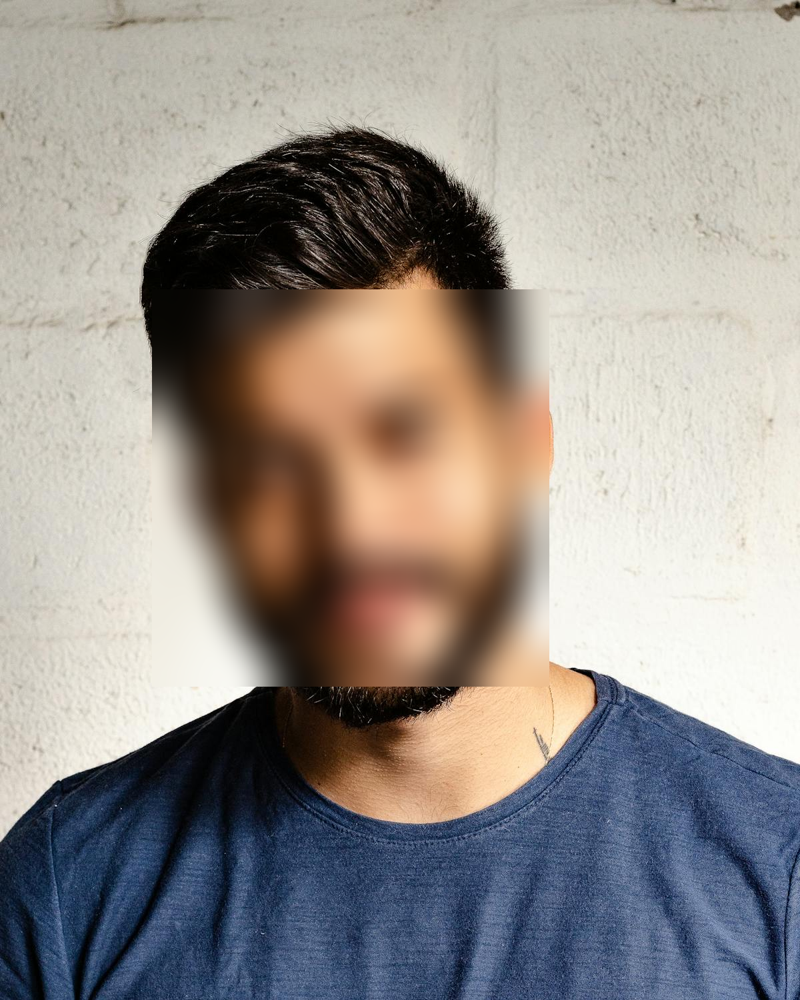

In [5]:
def blur_faces(image):
  # Load the Haar cascade for face detection
  face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

  # load the image
  img = np.array(image)

  # convert to RGB to BGR (OPencv uses BGR)
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

  #detection of faces
  faces = face_cascade.detectMultiScale(img, scaleFactor=1.1, minNeighbors=5, minSize=(30,30))

  # print(str(len(faces)) + ' faces detected')

  for (x, y, w, h) in faces:
    #select region of interest (roi)
    roi = img[y:y+h, x:x+w]

    #blur the roi
    blurred_roi = cv2.GaussianBlur(roi, (99,99), 30)

    #replace the original region in the image with the blurred region
    img[y:y+h, x:x+w] = blurred_roi

  display_image(img)

im = get_image("https://images.pexels.com/photos/2379005/pexels-photo-2379005.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=2")
blur_faces(im)

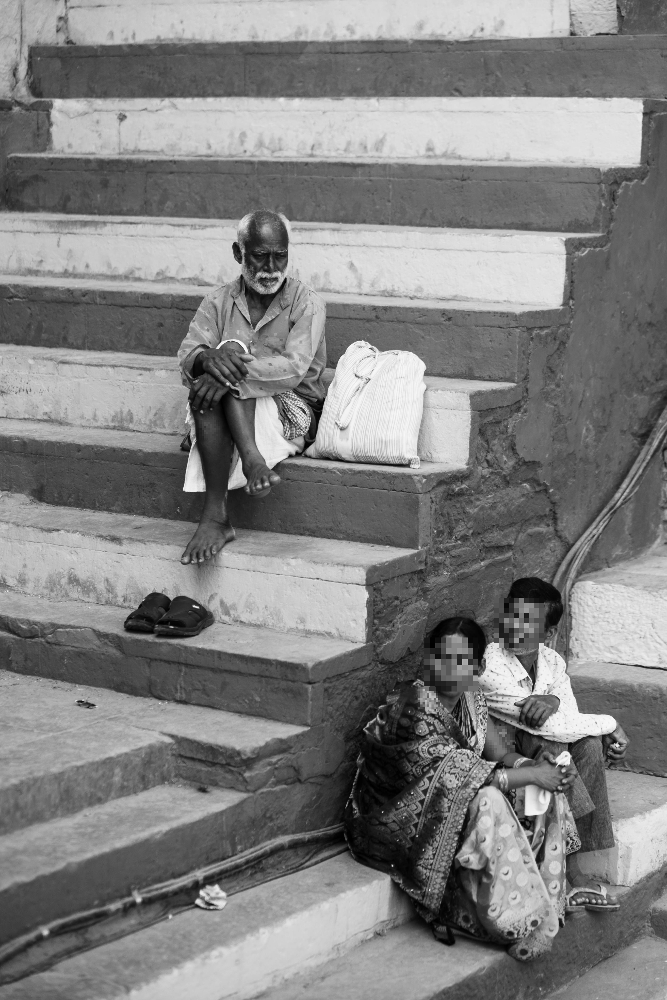

In [6]:

def pixelate_faces(image):
  # Load the Haar cascade for face detection
  face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

  # load the image
  img = np.array(image)

  # convert to RGB to BGR (OPencv uses BGR)
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

  #detection of faces
  faces = face_cascade.detectMultiScale(img, scaleFactor=1.1, minNeighbors=5, minSize=(30,30))

  for (x, y, w, h) in faces:
    #select region of interest (roi)
    roi = img[y:y+h, x:x+w]

    small = cv2.resize(roi, (10,10))
    pixelated_roi = cv2.resize(small, (w, h), interpolation=cv2.INTER_NEAREST)
    #replace
    img[y:y+h, x:x+w] = pixelated_roi

  display_image(img)


# im = get_image("https://images.pexels.com/photos/2379005/pexels-photo-2379005.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=2")
im = get_image("https://images.pexels.com/photos/18089526/pexels-photo-18089526/free-photo-of-bench-black-and-white-man-people.jpeg")
pixelate_faces(im)